In [1]:
using DataFrames, CSV, StatsBase, Plots, StatsPlots, CategoricalArrays, Statistics

In [2]:
function shannon_entropy(x::Vector{T}; percentage::Bool=true) where T <: Number
    x = x[x .!= 0 .&& .!isnan.(x)]  
    
    if isempty(x)  
        return 0.0
    end

    probs = x ./ sum(x)  # Normalize to probabilities
    shan = -sum(probs .* log2.(probs))  # Compute Shannon entropy

    if percentage
        shan = shan / log2(length(x))  # Normalize entropy (percentage mode)
    end

    return shan
end

shannon_entropy (generic function with 1 method)

In [3]:
# List of dataset names
dataset_names = [
    "block", "chalasani", "chen", "decruyenaere", "giraldez", "ibarra",
    "moufarrej", "ngo", "reggiardo", "roskams", "rozowsky", "sun",
    "tao", "taowei", "toden", "wang", "zhu"
]

gene_tpm = Dict()

for name in dataset_names
    df = CSV.read("$(name)_tpm.tsv", DataFrame; delim='\t', missingstring="", stringtype=String)

    rename!(df, 1 => "gene_id")  # Rename first column to "gene_id" explicitly
    gene_ids = df[:, "gene_id"]  # Extract gene IDs
    select!(df, Not("gene_id"))  # Remove "gene_id" from the main data

    # Remove "gene_name" column if it exists
    if "gene_name" in names(df)
        select!(df, Not("gene_name"))
    end

    # Force string columns to Float64 with type change
    for col in names(df)
        if eltype(df[!, col]) <: AbstractString
            parsed_col = tryparse.(Float64, df[!, col])
            df[!, col] = convert(Vector{Float64}, map(x -> x === nothing ? 0.0 : x, parsed_col))
        end
    end

    # Ensure all columns are numeric, replace non-numeric with 0
    for col in names(df)
        if !(eltype(df[!, col]) <: Number)
            df[!, col] .= map(x -> x isa Number ? x : 0.0, df[!, col])
        end
    end

    df.gene_id = gene_ids  # Keep gene IDs in the DataFrame
    gene_tpm[name] = df  # Store cleaned DataFrame
end


In [4]:
for (dataset, df) in gene_tpm
    println("Checking dataset: $dataset")
    for col in names(df)
        if eltype(df[!, col]) <: AbstractString
            println("String column found: $col")
        end
    end
end

Checking dataset: toden
String column found: gene_id
Checking dataset: decruyenaere
String column found: gene_id
Checking dataset: roskams
String column found: gene_id
Checking dataset: giraldez
String column found: gene_id
Checking dataset: ngo
String column found: gene_id
Checking dataset: block
String column found: gene_id
Checking dataset: rozowsky
String column found: gene_id
Checking dataset: taowei
String column found: gene_id
Checking dataset: moufarrej
String column found: gene_id
Checking dataset: ibarra
String column found: gene_id
Checking dataset: chalasani
String column found: gene_id
Checking dataset: sun
String column found: gene_id
Checking dataset: chen
String column found: gene_id
Checking dataset: tao
String column found: gene_id
Checking dataset: zhu
String column found: gene_id
Checking dataset: reggiardo
String column found: gene_id
Checking dataset: wang
String column found: gene_id


In [5]:
gene_tpm["toden"].gene_id

61632-element Vector{String}:
 "ENSG00000000003.15"
 "ENSG00000000005.6"
 "ENSG00000000419.14"
 "ENSG00000000457.14"
 "ENSG00000000460.17"
 "ENSG00000000938.13"
 "ENSG00000000971.16"
 "ENSG00000001036.14"
 "ENSG00000001084.13"
 "ENSG00000001167.15"
 "ENSG00000001460.18"
 "ENSG00000001461.17"
 "ENSG00000001497.18"
 ⋮
 "ERCC-00164"
 "ERCC-00165"
 "ERCC-00168"
 "ERCC-00170"
 "ERCC-00171"
 "SIRV1"
 "SIRV2"
 "SIRV3"
 "SIRV4"
 "SIRV5"
 "SIRV6"
 "SIRV7"

In [6]:
gn_shannon = Dict(
    dataset => map(col -> shannon_entropy(col, percentage=true), eachcol(select(df, Not(:gene_id))))
    for (dataset, df) in gene_tpm
)

Dict{String, Vector{Float64}} with 17 entries:
  "toden"        => [0.748786, 0.721868, 0.723687, 0.716102, 0.744435, 0.730297…
  "decruyenaere" => [0.398744, 0.370416, 0.371033, 0.384218, 0.401091, 0.397319…
  "roskams"      => [0.34245, 0.455129, 0.394979, 0.447734, 0.441576, 0.390619,…
  "giraldez"     => [0.202722, 0.271143, 0.248377, 0.295683, 0.246326, 0.284116…
  "ngo"          => [0.460849, 0.408992, 0.434901, 0.449446, 0.475998, 0.395118…
  "block"        => [0.391861, 0.670638, 0.553632, 0.591778, 0.470129, 0.670603…
  "rozowsky"     => [0.232902, 0.282611, 0.428248, 0.422312, 0.219175, 0.222032…
  "taowei"       => [0.968364, 0.969923, 0.970852, 0.965243, 0.967555, 0.968877…
  "moufarrej"    => [0.273291, 0.281961, 0.328092, 0.446693, 0.35821, 0.398902,…
  "ibarra"       => [0.599104, 0.705616, 0.710599, 0.78875, 0.713467, 0.793775,…
  "chalasani"    => [0.736708, 0.746856, 0.767361, 0.788287, 0.760933, 0.724485…
  "sun"          => [0.433759, 0.446438, 0.504297, 0.45929, 0.

In [7]:
shannon_df = DataFrame(Dataset=String[], Sample=String[], ShannonEntropy=Float64[])

for (dataset, entropies) in gn_shannon
    append!(shannon_df, DataFrame(Dataset=fill(dataset, length(entropies)), 
                                  Sample=names(gene_tpm[dataset]), 
                                  ShannonEntropy=entropies))
end


LoadError: DimensionMismatch: column :Dataset has length 338 and column :Sample has length 339

In [10]:


shannon_df = DataFrame(Dataset=String[], Sample=String[], ShannonEntropy=Float64[])

for (dataset, entropies) in gn_shannon
    append!(shannon_df, DataFrame(
        Dataset = fill(dataset, length(entropies)), 
        Sample = names(select(gene_tpm[dataset], Not(:gene_id))), 
        ShannonEntropy = entropies
    ))
end


In [11]:
CSV.write("shannon_entropy.csv", shannon_df)

"shannon_entropy.csv"

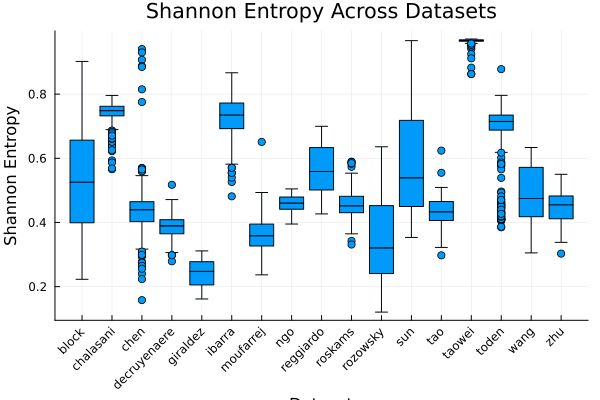

In [49]:
# Convert Dataset column to categorical for correct ordering
shannon_df.Dataset = categorical(shannon_df.Dataset)

@df shannon_df boxplot(
    :Dataset, :ShannonEntropy, legend=false,
    xlabel="Dataset", ylabel="Shannon Entropy",
    title="Shannon Entropy Across Datasets",
    xticks=(1:length(levels(shannon_df.Dataset)), levels(shannon_df.Dataset)),  
    xrotation=45  
)

In [50]:
library_diversity_df = CSV.read("final_external_datasets_QC_table.csv", DataFrame)

println(names(library_diversity_df))  # Check column names

rename!(library_diversity_df, "Genes_contributing_to_80%_of_reads" => :LibraryDiversity)

# Merge Shannon entropy and library diversity data by "Sample"
merged_df = innerjoin(shannon_df, library_diversity_df, on=:Sample)



["Sample", "dataset", "phenotype", "per_base_sequence_quality", "per_sequence_quality_scores", "per_base_sequence_content", "per_sequence_gc_content", "per_base_n_content", "sequence_length_distribution", "sequence_duplication_levels", "overrepresented_sequences", "adapter_content", "Read_number", "Reads_passing_trimming", "Percentage_reads_passing_trimming", "total_reads", "avg_input_read_length", "number_of_uniquely_mapped_reads", "percentage_of_uniquely_mapped_reads", "avg_mapped_read_length", "number_of_multimapped_reads", "percentage_of_unmapped_too_short_reads", "mapped_percentage", "average_mapped_length_percentage", "Number_mapped_unique_molecules", "Percentage_unique_molecules", "Qualimap_Exonic", "Qualimap_Intronic", "Qualimap_Intergenic", "Qualimap_Exonic_percentage", "Qualimap_Intronic_percentage", "Qualimap_Intergenic_percentage", "Exonic", "Intronic", "Intergenic", "Exonic_percentage", "Intronic_percentage", "Intergenic_percentage", "Mapped_fragments", "uniquely_mapped_re

Row,Dataset,Sample,ShannonEntropy,dataset,phenotype,per_base_sequence_quality,per_sequence_quality_scores,per_base_sequence_content,per_sequence_gc_content,per_base_n_content,sequence_length_distribution,sequence_duplication_levels,overrepresented_sequences,adapter_content,Read_number,Reads_passing_trimming,Percentage_reads_passing_trimming,total_reads,avg_input_read_length,number_of_uniquely_mapped_reads,percentage_of_uniquely_mapped_reads,avg_mapped_read_length,number_of_multimapped_reads,percentage_of_unmapped_too_short_reads,mapped_percentage,average_mapped_length_percentage,Number_mapped_unique_molecules,Percentage_unique_molecules,Qualimap_Exonic,Qualimap_Intronic,Qualimap_Intergenic,Qualimap_Exonic_percentage,Qualimap_Intronic_percentage,Qualimap_Intergenic_percentage,Exonic,Intronic,Intergenic,Exonic_percentage,Intronic_percentage,Intergenic_percentage,Mapped_fragments,uniquely_mapped_reads,spliced_reads,percentage_of_spliced_reads,total_splice_junctions,known_splice_junctions,%known_splice_junctions,Junction_saturation_slope,read_coverage_uniformity_score,median_insert_size,Genes_contributing_to_1%_of_reads,Genes_contributing_to_5%_of_reads,Genes_contributing_to_10%_of_reads,Genes_contributing_to_50%_of_reads,LibraryDiversity,Reads_mapping_sense_percentage,Reads_mapping_antisense_percentage,Reads_undetermined_strandedness_percentage,IG_C_gene,IG_C_gene_fc,IG_C_pseudogene,IG_C_pseudogene_fc,IG_D_gene,IG_D_gene_fc,IG_J_gene,IG_J_gene_fc,IG_J_pseudogene,IG_J_pseudogene_fc,IG_V_gene,IG_V_gene_fc,IG_V_pseudogene,IG_V_pseudogene_fc,IG_pseudogene,IG_pseudogene_fc,Mt_rRNA,Mt_rRNA_fc,Mt_tRNA,Mt_tRNA_fc,TEC,TEC_fc,TR_C_gene,TR_C_gene_fc,TR_D_gene,TR_D_gene_fc,TR_J_gene,TR_J_gene_fc,TR_J_pseudogene,TR_J_pseudogene_fc,TR_V_gene,TR_V_gene_fc,TR_V_pseudogene,TR_V_pseudogene_fc,lncRNA,lncRNA_fc,miRNA,miRNA_fc,misc_RNA,misc_RNA_fc,polymorphic_pseudogene,polymorphic_pseudogene_fc,⋯
,Cat…,String,Float64,String15,String31?,String7,String7,String7,String7,String7,String7,String7,String7,String7,Int64,Int64,Int64,Int64,Int64,Int64,Float64,Float64,Int64,Float64,Float64,Float64,Int64?,Float64?,Int64,Int64,Int64,Float64,Float64,Float64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Float64,Int64,Int64,Float64,Float64,Float64,Float64?,Int64,Int64,Int64,Int64,Int64,Float64,Float64,Float64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,Float64,Int64,⋯
1,decruyenaere,RNA019969_S2,0.398744,decru,missing,pass,pass,fail,pass,fail,fail,pass,warn,fail,20887048,20887048,100,19541163,177,9721557,49.75,175.9,2618771,31.28,63.1504,99.3785,6729107,54.5,7912672,929084,1473818,76.7061,9.00661,14.2873,5255075,520492,807269,79,7,12,6582836,10533886,358504,3.40334,58167,52315,89.9393,1.94614,0.608522,129.0,1,1,1,2,11,12.23,58.03,29.74,8.5,6,0.0,0,0.0,0,2.0,1,0.5,0,16.0,8,5.0,0,0.0,0,2.75767e6,2599593,94817.5,42594,708.667,141,19.8333,20,0.0,0,0.833333,0,0.0,0,19.8333,16,7.0,7,97302.7,10691,2228.17,335,3.25752e5,67349,39.0,22,⋯
2,decruyenaere,RNA019970_S3,0.370416,decru,missing,pass,pass,fail,pass,fail,fail,pass,warn,fail,21629999,21629999,100,21043518,179,12165781,57.81,179.2,3728714,21.43,75.5315,100.112,9356367,58.8,10240844,1073304,1572674,79.4676,8.32869,12.2037,7336361,634189,1191053,80,6,13,9161603,13590664,1086581,7.99505,94929,83494,87.9542,1.52484,0.692559,146.0,1,1,1,4,38,5.12,54.99,39.89,525.167,397,6.33333,2,1.5,1,17.1667,2,0.0,0,100.167,59,14.5,5,0.0,0,2.59728e6,2469844,1.12591e5,43800,1850.92,234,144.333,125,0.0,0,23.0,14,0.0,0,83.1667,72,18.0,14,3.07735e5,25888,3771.83,163,1.00194e6,256665,55.5,32,⋯
3,decruyenaere,RNA019971_S4,0.371033,decru,missing,pass,pass,fail,pass,fail,fail,pass,warn,fail,25267960,25267960,100,24224860,180,16231976,67.01,180.23,3171776,17.37,80.0985,100.128,11018733,56.7,13903994,1000946,

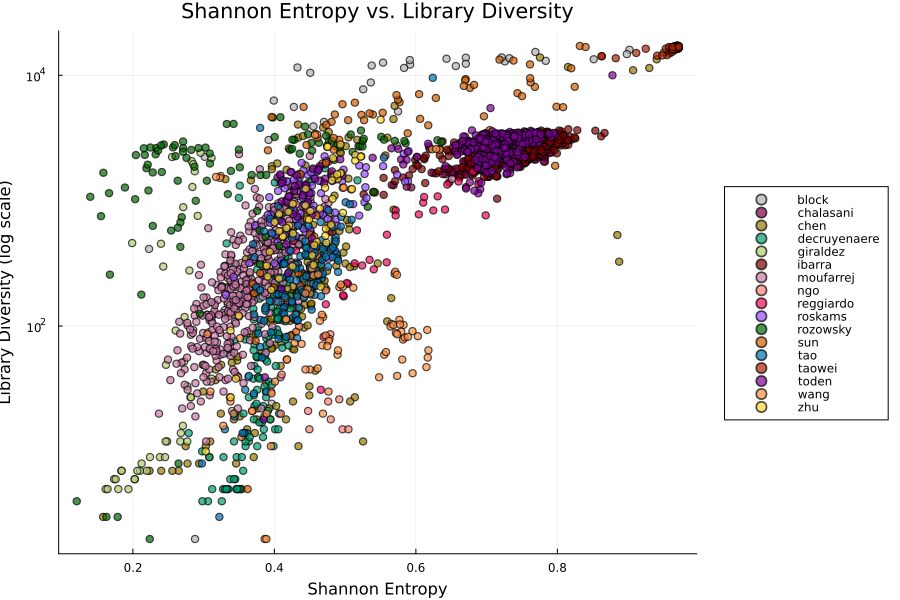

In [51]:
datasets_palette = Dict(
    "block" => "#b3b3b3",
    "decruyenaere" => "#009E73",
    "zhu" => "#ffd633",
    "chen" => "#997a00",
    "ngo" => "#fa8072",
    "roskams" => "#944dff",
    "moufarrej" => "#CC79A7",
    "sun" => "#D55E00",
    "tao" => "#0072B2",
    "toden" => "#800099",
    "ibarra" => "#800000",
    "chalasani" => "#800040",
    "rozowsky" => "#006600",
    "taowei" => "#B32400",
    "giraldez" => "#B1CC71",
    "reggiardo" => "#F1085C",
    "wang" => "#FE8F42"
)

merged_df.Dataset = categorical(merged_df.Dataset)

# Map dataset names to colors
dataset_colors = getindex.(Ref(datasets_palette), string.(merged_df.Dataset))

@df merged_df scatter(
    :ShannonEntropy, :LibraryDiversity,
    group=:Dataset,  
    seriescolor=dataset_colors,  
    xlabel="Shannon Entropy", ylabel="Library Diversity (log scale)",
    title="Shannon Entropy vs. Library Diversity",
    markersize=4, alpha=0.7, 
    yscale=:log10,  
    legend=:outerright, 
    size=(900, 600)  
)


In [52]:
function shannon_entropy(x::Vector{T}; percentage::Bool=true) where T <: Number
    x = x[x .!= 0 .&& .!isnan.(x)]  

    if isempty(x) 
        return 0.0
    end

    probs = x ./ sum(x) 
    shan = -sum(probs .* log2.(probs))  

    if percentage
        shan = shan / log2(length(x))  
    end

    return shan
end

shannon_entropy (generic function with 1 method)

In [17]:
all_gene_ids = unique(vcat([dataset.gene_id for dataset in values(gene_tpm)]...))

Identify genes that are zero across ALL datasets
zero_genes = filter(gene -> all(all(Matrix(dataset[dataset.gene_id .== gene, Not(:gene_id)]) .== 0) for dataset in values(gene_tpm)), all_gene_ids)


LoadError: UndefVarError: `Identify` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [18]:
zero_genes

LoadError: UndefVarError: `zero_genes` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [19]:
#Remove these genes from all datasets
filtered_gene_tpm = Dict(
    name => dataset[.!in.(dataset.gene_id, Ref(zero_genes)), :]
    for (name, dataset) in gene_tpm
)

LoadError: UndefVarError: `zero_genes` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [20]:
gn_shannon_genes = Dict(
    name => map(row -> shannon_entropy(collect(row), percentage=true), eachrow(dataset[:, Not(:gene_id)]))
    for (name, dataset) in filtered_gene_tpm
)

LoadError: UndefVarError: `filtered_gene_tpm` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [21]:
gene_ids = filtered_gene_tpm[first(keys(filtered_gene_tpm))].gene_id  # Use one dataset's genes
gene_shannon_df = DataFrame(
    Gene=gene_ids,
    ShannonEntropy=mean(reduce(hcat, values(gn_shannon_genes)), dims=2)[:]  # Compute mean entropy per gene
)

LoadError: UndefVarError: `filtered_gene_tpm` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [22]:
gene_shannon_df = filter(row -> isfinite(row.ShannonEntropy), gene_shannon_df)

LoadError: UndefVarError: `gene_shannon_df` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [23]:
@df gene_shannon_df histogram(
    :ShannonEntropy, bins=30,
    xlabel="Shannon Entropy", ylabel="Frequency",
    title="Distribution of Shannon Entropy Across Genes",
    fillalpha=0.7, linecolor=:black, color=:steelblue
)

LoadError: UndefVarError: `gene_shannon_df` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [24]:
#Identify genes with zero Shannon entropy
zero_entropy_genes = gene_shannon_df[gene_shannon_df.ShannonEntropy .<= 0.15, :Gene]

#zero_entropy_per_dataset = Dict(
#    name => dataset[in.(dataset.gene_id, Ref(zero_entropy_genes)), :]
#    for (name, dataset) in gene_tpm
#)

#zero_entropy_per_dataset

LoadError: UndefVarError: `gene_shannon_df` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [25]:
zero_entropy_genes #not zero, very low

LoadError: UndefVarError: `zero_entropy_genes` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [26]:
gene_tpm = Dict()
gene_id_to_name = Dict()  # Dictionary to store gene_id → gene_name

for name in dataset_names
    df = CSV.read("$(name)_tpm.tsv", DataFrame; delim='\t', missingstring="", stringtype=String)

    rename!(df, 1 => "gene_id")  

    # Extract gene_id & gene_name BEFORE removing them
    if "gene_name" in names(df)
        if isempty(gene_id_to_name)  
            gene_id_to_name = Dict(row[:gene_id] => row[:gene_name] for row in eachrow(df))
        end
        select!(df, Not("gene_name")) 
    end

    gene_ids = df[:, "gene_id"]  # Extract gene IDs
    select!(df, Not("gene_id"))  # Remove gene_id from numeric data

    for col in names(df)
        if eltype(df[!, col]) <: AbstractString 
            df[!, col] .= tryparse.(Float64, df[!, col]) 
        end
    end

    for col in names(df)
        if !(eltype(df[!, col]) <: Number)
            df[!, col] .= map(x -> x isa Number ? x : 0.0, df[!, col])
        end
    end

    df.gene_id = gene_ids  # Keep gene IDs in the DataFrame
    gene_tpm[name] = df  # Store cleaned DataFrame
end


In [27]:
#Match zero entropy genes with their gene_name
zero_entropy_gene_names = Dict(
    gene => get(gene_id_to_name, gene, "Unknown")  # Retrieve name or "Unknown" if missing
    for gene in zero_entropy_genes
)

zero_entropy_df = DataFrame(
    GeneID=zero_entropy_genes,
    GeneName=[zero_entropy_gene_names[gene] for gene in zero_entropy_genes]
)

println(zero_entropy_df)

LoadError: UndefVarError: `zero_entropy_genes` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [28]:
using MultivariateStats  # for PCA
using LinearAlgebra      # for matrix operations

In [55]:
using DataFrames, CSV, Statistics

dataset_names = [
    "block", "chalasani", "chen", "decruyenaere", "giraldez", "ibarra",
    "moufarrej", "ngo", "reggiardo", "roskams", "rozowsky", "sun",
    "tao", "taowei", "toden", "wang", "zhu"
]

gene_tpm = Dict()
gene_id_to_name = Dict()

for name in dataset_names
    df = CSV.read("$(name)_tpm.tsv", DataFrame; delim='\t', stringtype=String, missingstring="")

    # Make sure gene_id is the first column
    rename!(df, 1 => :gene_id)

    # Store gene_name mapping only once
    if isempty(gene_id_to_name) && "gene_name" in names(df)
        gene_id_to_name = Dict(row.gene_id => row.gene_name for row in eachrow(df))
    end

    # Remove gene_name if present
    if "gene_name" in names(df)
        select!(df, Not("gene_name"))
    end

    # Store cleaned df
    gene_tpm[name] = df
end


In [57]:
using MultivariateStats, LinearAlgebra

# Step 1: Stack all datasets with unique sample names
stacked_dfs = []
sample_to_dataset = Dict()

for (dataset_name, df) in gene_tpm
    renamed_df = copy(df)
    for col in names(select(df, Not(:gene_id)))
        new_col = "$(dataset_name):$(col)"
        rename!(renamed_df, col => new_col)
        sample_to_dataset[new_col] = dataset_name
    end
    push!(stacked_dfs, renamed_df)
end


In [58]:
# Step 2: Ensure all datasets have the same row order (by gene_id)
gene_ids = stacked_dfs[1].gene_id
for df in stacked_dfs
    @assert all(df.gene_id .== gene_ids) "Gene order mismatch!"
end


In [59]:
# Step 3: Combine all datasets column-wise (excluding gene_id)
combined_expr = hcat([select(df, Not(:gene_id)) for df in stacked_dfs]...)

Row,toden:SRR10192165,toden:SRR10192166,toden:SRR10192167,toden:SRR10192168,toden:SRR10192169,toden:SRR10192170,toden:SRR10192171,toden:SRR10192172,toden:SRR10192173,toden:SRR10192174,toden:SRR10192175,toden:SRR10192176,toden:SRR10192177,toden:SRR10192178,toden:SRR10192179,toden:SRR10192180,toden:SRR10192181,toden:SRR10192182,toden:SRR10192183,toden:SRR10192184,toden:SRR10192185,toden:SRR10192186,toden:SRR10192187,toden:SRR10192188,toden:SRR10192189,toden:SRR10192190,toden:SRR10192191,toden:SRR10192192,toden:SRR10192193,toden:SRR10192194,toden:SRR10192195,toden:SRR10192196,toden:SRR10192197,toden:SRR10192198,toden:SRR10192199,toden:SRR10192200,toden:SRR10192201,toden:SRR10192202,toden:SRR10192203,toden:SRR10192204,toden:SRR10192205,toden:SRR10192206,toden:SRR10192207,toden:SRR10192208,toden:SRR10192209,toden:SRR10192210,toden:SRR10192211,toden:SRR10192212,toden:SRR10192213,toden:SRR10192214,toden:SRR10192215,toden:SRR10192216,toden:SRR10192217,toden:SRR10192218,toden:SRR10192219,toden:SRR10192220,toden:SRR10192221,toden:SRR10192222,toden:SRR10192223,toden:SRR10192224,toden:SRR10192225,toden:SRR10192226,toden:SRR10192227,toden:SRR10192228,toden:SRR10192229,toden:SRR10192230,toden:SRR10192231,toden:SRR10192232,toden:SRR10192233,toden:SRR10192234,toden:SRR10192235,toden:SRR10192236,toden:SRR10192237,toden:SRR10192238,toden:SRR10192239,toden:SRR10192240,toden:SRR10192241,toden:SRR10192242,toden:SRR10192243,toden:SRR10192244,toden:SRR10192245,toden:SRR10192246,toden:SRR10192247,toden:SRR10192248,toden:SRR10192249,toden:SRR10192250,toden:SRR10192251,toden:SRR10192252,toden:SRR10192253,toden:SRR10192254,toden:SRR10192255,toden:SRR10192256,toden:SRR10192257,toden:SRR10192258,toden:SRR10192259,toden:SRR10192260,toden:SRR10192261,toden:SRR10192262,toden:SRR10192263,toden:SRR10192264,⋯
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,⋯
1,0.0,0.0723,0.982964,0.0,0.771369,2.3016,1.76915,1.17837,0.0,0.536344,0.621145,0.749852,0.4565,1.80027,0.629951,0.645361,0.713006,0.974057,1.1217,1.27511,0.324131,0.147361,0.625,0.15253,0.2745,0.661698,1.1452,0.567146,0.207981,0.846158,1.42901,0.188979,0.014949,0.0,0.385834,1.00813,0.105117,0.583881,0.8316,1.42337,0.410026,0.919974,0.0,0.628891,0.190713,0.69559,0.677095,0.0,0.334909,0.0,0.236379,1.60125,0.298905,0.593124,0.214768,0.100476,0.962245,0.124546,0.630888,0.405424,0.0,0.038061,0.0,0.7096,2.90272,0.159754,0.0,0.364119,0.0,0.528028,1.17468,1.62482,0.576299,3.89556,0.96375,3.31796,0.0,0.286506,0.701771,0.90957,1.78019,0.424135,0.427199,0.374185,3.03698,0.796177,0.087494,1.20374,0.284722,0.061998,0.0,0.04194,1.70494,2.53113,0.0,0.487457,0.359178,0.405729,0.397314,0.509979,⋯
2,0.0,0.536748,0.197772,0.0,0.872059,2.21451,5.24682,0.0,0.577818,0.0,2.29991,0.0,0.0,0.0,0.0,0.0,0.273958,0.0,0.0,0.567912,0.65737,0.0,0.0,0.0,1.01967,0.0,0.0,0.932631,0.306088,0.753729,0.98072,0.0,0.0,0.0,1.68218,0.305086,0.0,0.0,0.238132,0.0,0.313774,0.402176,0.0,0.239868,0.0,0.0,0.645955,0.0,0.131379,0.0,0.0,0.0,2.21047,0.399885,0.0,0.281271,0.0,0.611152,0.421301,0.832408,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.99283,0.944875,0.799154,0.0,0.250862,6.40473,1.61353,0.274851,0.0,0.0,0.297913,0.0,0.0,0.461101,0.845308,0.0,0.165686,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.906233,0.0,0.163392,0.0,0.0,1.

In [60]:
# Step 4: Transpose the expression matrix (samples as rows)
X = Matrix(combined_expr)'
X = replace!(X, missing => 0.0)
X = convert(Matrix{Float64}, X)

3186×61632 Matrix{Float64}:
 0.0       0.0       26.1381    6.19596  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0723    0.536748  36.6776    1.82098     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.982964  0.197772  35.3016    6.69251     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0       0.0       90.9427    7.42367     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.771369  0.872059  52.6194    3.83892     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 2.3016    2.21451   71.8191    6.31025  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.76915   5.24682   89.9773   10.7118      0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.17837   0.0       79.5915   11.4242      0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0       0.577818  24.5407    3.38328     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.536344  0.0       83.9077    5.47848     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.621145  2.29991   64.3493    8.27605  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.749852  0.0       42.8513    5.2226      0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.4565    0.0       48.0106    6.43

In [79]:
X = Matrix(combined_expr)'  # <--- transpose!

3186×61632 adjoint(::Matrix{Float64}) with eltype Float64:
 0.0       0.0       26.1381    6.19596  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0723    0.536748  36.6776    1.82098     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.982964  0.197772  35.3016    6.69251     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0       0.0       90.9427    7.42367     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.771369  0.872059  52.6194    3.83892     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 2.3016    2.21451   71.8191    6.31025  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.76915   5.24682   89.9773   10.7118      0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.17837   0.0       79.5915   11.4242      0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0       0.577818  24.5407    3.38328     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.536344  0.0       83.9077    5.47848     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.621145  2.29991   64.3493    8.27605  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.749852  0.0       42.8513    5.2226      0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.45

In [80]:
bad_cols = findall(col -> any(isnan, col) || std(col) == 0.0, eachcol(X))
good_col_indices = setdiff(1:size(X, 2), bad_cols)
X_clean = X[:, good_col_indices]
X_z = (X_clean .- mean(X_clean, dims=1)) ./ std(X_clean, dims=1)

3186×61054 Matrix{Float64}:
 -0.377144    -0.265675    0.378571  …  -0.0867346  -0.0796406  -0.04464
 -0.353428    -0.0620543   0.890477     -0.0867346  -0.0796406  -0.04464
 -0.0547049   -0.190648    0.823641     -0.0867346  -0.0796406  -0.04464
 -0.377144    -0.265675    3.52613      -0.0867346  -0.0796406  -0.04464
 -0.124114     0.0651493   1.66477      -0.0867346  -0.0796406  -0.04464
  0.377845     0.574422    2.5973    …  -0.0867346  -0.0796406  -0.04464
  0.203187     1.72476     3.47924      -0.0867346  -0.0796406  -0.04464
  0.00939528  -0.265675    2.9748       -0.0867346  -0.0796406  -0.04464
 -0.377144    -0.046474    0.300985     -0.0867346  -0.0796406  -0.04464
 -0.201208    -0.265675    3.18444      -0.0867346  -0.0796406  -0.04464
 -0.173391     0.606819    2.23449   …  -0.0867346  -0.0796406  -0.04464
 -0.131172    -0.265675    1.19033      -0.0867346  -0.0796406  -0.04464
 -0.227399    -0.265675    1.44092      -0.0867346  -0.0796406  -0.04464
  ⋮                    

In [83]:
pca_model = fit(PCA, X_z'; maxoutdim=5, method=:svd)
X_pca_t = MultivariateStats.transform(pca_model, X_z')  # will be 5 × 3186
X_pca = X_pca_t'  # transpose back to 3186 × 5


3186×5 adjoint(::Matrix{Float64}) with eltype Float64:
  25.5206  -61.4365   -8.27382   -5.59167    6.4236
  28.3059  -46.5183  -12.2154    -3.52477    7.21016
  29.7059  -50.789    -9.73548   -5.36915    5.79723
  26.7136  -54.1587   -7.42006   -0.153251   2.51883
  27.8582  -65.819    -8.74678   -6.51093    5.55972
  21.7384  -77.2656   -9.23145    3.18941    1.80314
  22.3484  -76.5519   -9.10051    1.83736    2.42878
  19.6741  -82.6081   -2.83109    3.39909   -0.120332
  31.7558  -11.9809    0.436308  -1.64585   -0.359361
  22.8106  -58.6171   -0.658966   1.30477   -0.406422
  26.2482  -58.5787   -5.3509    -0.623346   1.61577
  22.0415  -86.1872    1.89888   -0.835052  -0.866946
  26.3729  -57.6345  -10.7326    -0.753139   4.10607
   ⋮                                        
  43.52     68.7621   -1.80877   -4.65642    1.32078
  42.7339   68.5245   -1.78727   -4.38226    1.76566
 -25.0005   65.0472  -22.7003    18.225      2.69009
 -24.3239   64.5358  -23.285     19.5106     2.72

In [89]:
sample_names = names(combined_expr)  # these are the sample column names
@assert size(X_pca, 1) == length(sample_names)

pca_df = DataFrame(
    PC1 = X_pca[:, 1],
    PC2 = X_pca[:, 2],
    Sample = sample_names,
    Dataset = [sample_to_dataset[s] for s in sample_names]
)

Row,PC1,PC2,Sample,Dataset
,Float64,Float64,String,String
1,25.5206,-61.4365,toden:SRR10192165,toden
2,28.3059,-46.5183,toden:SRR10192166,toden
3,29.7059,-50.789,toden:SRR10192167,toden
4,26.7136,-54.1587,toden:SRR10192168,toden
5,27.8582,-65.819,toden:SRR10192169,toden
6,21.7384,-77.2656,toden:SRR10192170,toden
7,22.3484,-76.5519,toden:SRR10192171,toden
8,19.6741,-82.6081,toden:SRR10192172,toden
9,31.7558,-11.9809,toden:SRR10192173,toden


In [85]:
#pca_df.Dataset = categorical(pca_df.Dataset)

3186-element CategoricalArray{String,1,UInt32}:
 "toden"
 "toden"
 "toden"
 "toden"
 "toden"
 "toden"
 "toden"
 "toden"
 "toden"
 "toden"
 "toden"
 "toden"
 "toden"
 ⋮
 "wang"
 "wang"
 "wang"
 "wang"
 "wang"
 "wang"
 "wang"
 "wang"
 "wang"
 "wang"
 "wang"
 "wang"

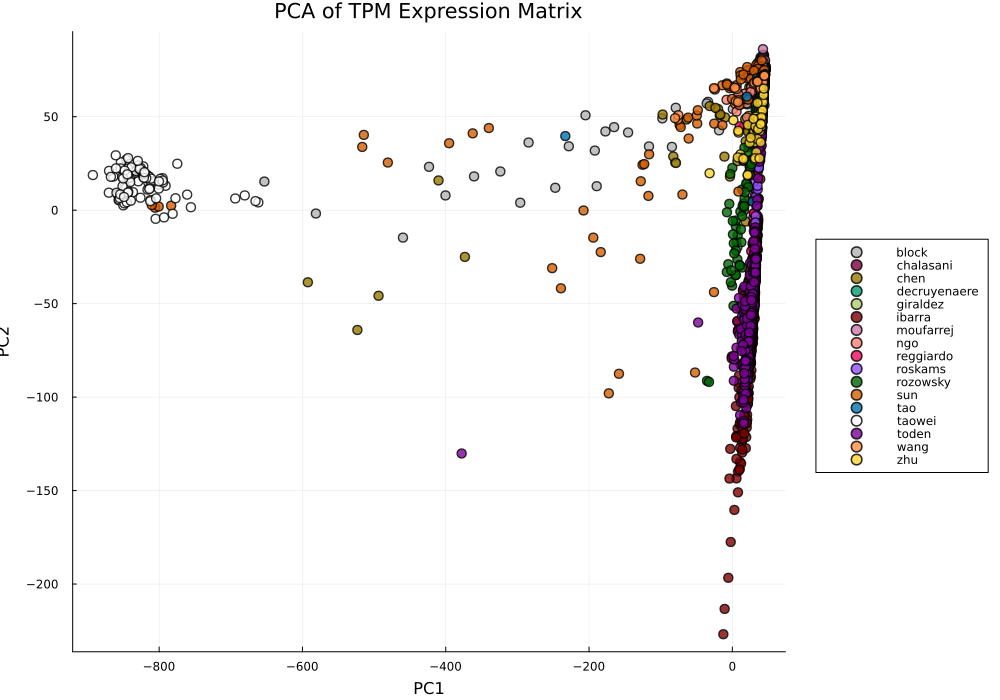

In [94]:
datasets_palette = Dict(
    "block" => "#b3b3b3",
    "decruyenaere" => "#009E73",
    "zhu" => "#ffd633",
    "chen" => "#997a00",
    "ngo" => "#fa8072",
    "roskams" => "#944dff",
    "moufarrej" => "#CC79A7",
    "sun" => "#D55E00",
    "tao" => "#0072B2",
    "toden" => "#800099",
    "ibarra" => "#800000",
    "chalasani" => "#800040",
    "rozowsky" => "#006600",
    "taowei" => "#ffffff",
    "giraldez" => "#B1CC71",
    "reggiardo" => "#F1085C",
    "wang" => "#FE8F42"
)

merged_df.Dataset = categorical(merged_df.Dataset)

# Map dataset names to colors
color_vector = getindex.(Ref(datasets_palette), String.(pca_df.Dataset))
@df pca_df scatter(
    :PC1, :PC2,
    color = color_vector,
    group = :Dataset,
    xlabel = "PC1",
    ylabel = "PC2",
    title = "PCA of TPM Expression Matrix",
    markersize = 5,
    alpha = 0.8,
    legend = :outerright,
    size = (1000, 700)
)



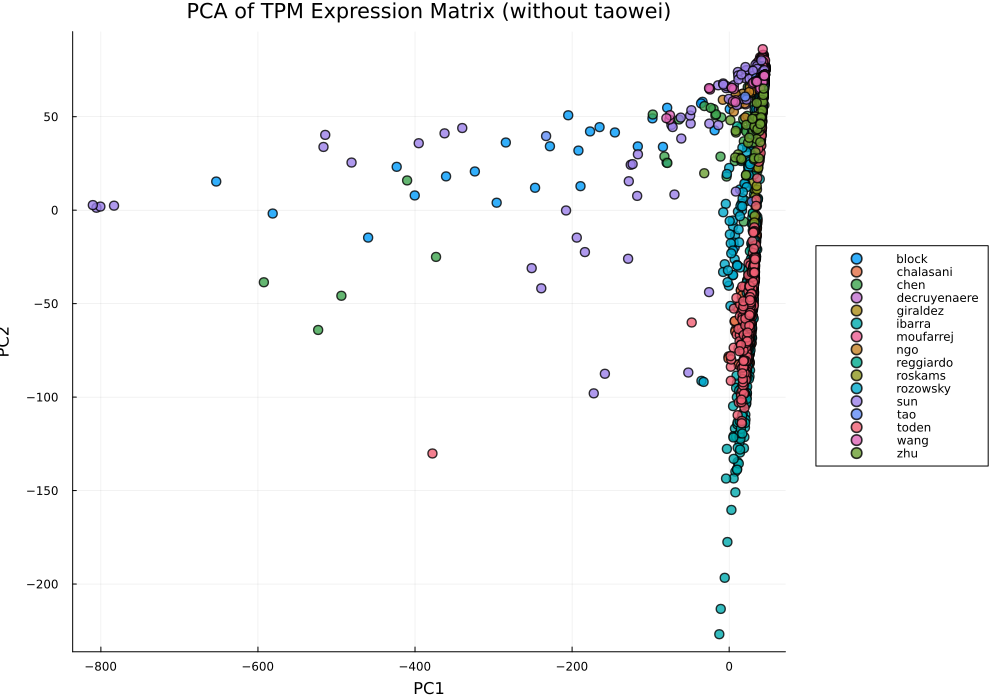

In [95]:
pca_df_no_taowei = filter(:Dataset => d -> d != "taowei", pca_df)

@df pca_df_no_taowei scatter(
    :PC1, :PC2,
    group = :Dataset,
    xlabel = "PC1",
    ylabel = "PC2",
    title = "PCA of TPM Expression Matrix (without taowei)",
    markersize = 5,
    alpha = 0.8,
    legend = :outerright,
    size = (1000, 700)
)


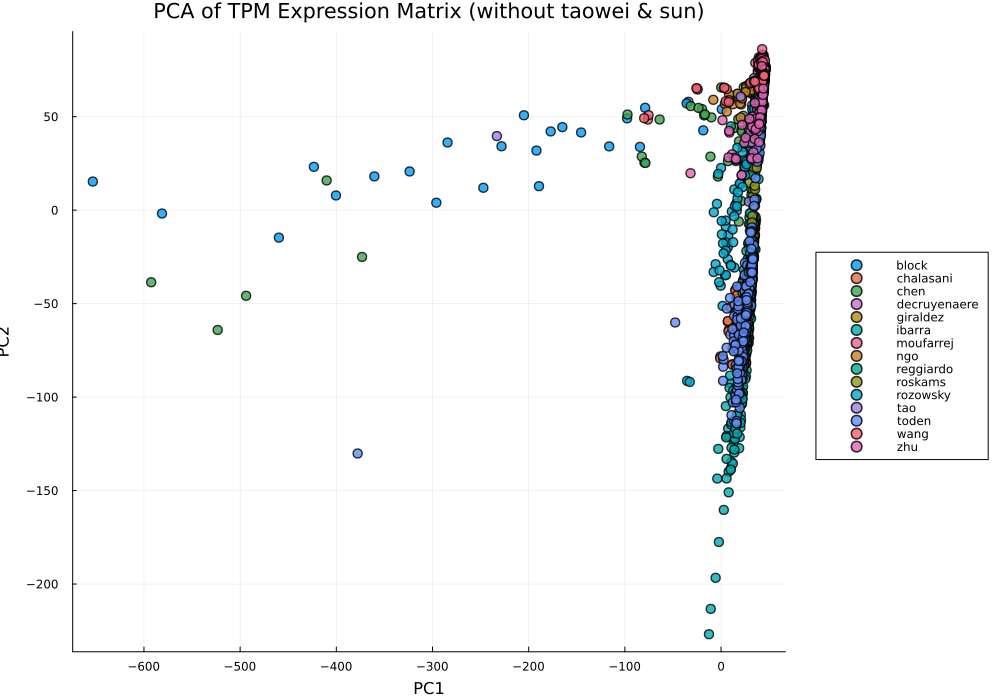

In [96]:
exclude_datasets = Set(["taowei", "sun"])

pca_df_filtered = filter(:Dataset => d -> !(d in exclude_datasets), pca_df)

@df pca_df_filtered scatter(
    :PC1, :PC2,
    group = :Dataset,
    xlabel = "PC1",
    ylabel = "PC2",
    title = "PCA of TPM Expression Matrix (without taowei & sun)",
    markersize = 5,
    alpha = 0.8,
    legend = :outerright,
    size = (1000, 700)
)


In [97]:
# Keep genes expressed (>0 TPM) in at least, say, 10% of samples
gene_filter = vec(sum(X .> 0, dims=1)) .>= size(X, 1) * 0.1
X_filtered = X[:, gene_filter]


3186×32407 Matrix{Float64}:
 0.0       0.0       26.1381    6.19596  …  0.0       0.0       24.452   0.0
 0.0723    0.536748  36.6776    1.82098     0.0       0.679003  49.2549  0.0
 0.982964  0.197772  35.3016    6.69251     0.105763  0.0       13.5224  0.0
 0.0       0.0       90.9427    7.42367     0.845514  0.991437  54.5448  0.0
 0.771369  0.872059  52.6194    3.83892     0.089319  0.215581  14.611   0.0
 2.3016    2.21451   71.8191    6.31025  …  0.919461  0.715523  64.4141  0.0
 1.76915   5.24682   89.9773   10.7118      1.45948   0.0       42.913   0.0
 1.17837   0.0       79.5915   11.4242      1.32051   0.896826  63.4329  0.0
 0.0       0.577818  24.5407    3.38328     0.895068  0.0       41.1077  0.0
 0.536344  0.0       83.9077    5.47848     0.0       0.187096  70.9528  0.0
 0.621145  2.29991   64.3493    8.27605  …  0.465499  0.863648  31.0338  0.0
 0.749852  0.0       42.8513    5.2226      0.639679  0.258246  31.4167  0.0
 0.4565    0.0       48.0106    6.43752     0.21

In [98]:
sort(pca_df, :PC1)


Row,PC1,PC2,Sample,Dataset
,Float64,Float64,String,String
1,-892.559,18.8036,taowei:SRR11810039,taowei
2,-870.224,9.36958,taowei:SRR11810047,taowei
3,-869.888,21.0199,taowei:SRR11810035,taowei
4,-867.388,17.8383,taowei:SRR11810051,taowei
5,-864.092,18.0021,taowei:SRR11809987,taowei
6,-860.554,29.3574,taowei:SRR11810026,taowei
7,-860.282,22.3691,taowei:SRR11810071,taowei
8,-859.557,9.30467,taowei:SRR11810054,taowei
9,-857.724,8.61517,taowei:SRR11810012,taowei


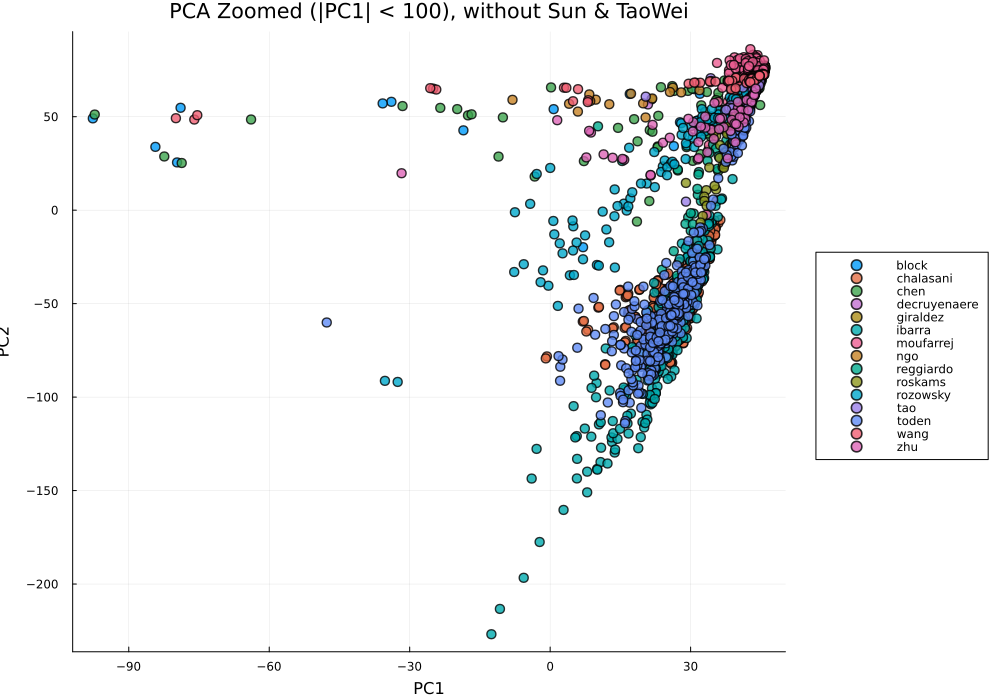

In [103]:
@df filter(:PC1 => x -> x > -100 && x < 100, pca_df_filtered) scatter(
    :PC1, :PC2,
    group = :Dataset,
    xlabel = "PC1",
    ylabel = "PC2",
    title = "PCA Zoomed (|PC1| < 100), without Sun & TaoWei",
    markersize = 5,
    alpha = 0.8,
    legend = :outerright,
    size = (1000, 700)
)


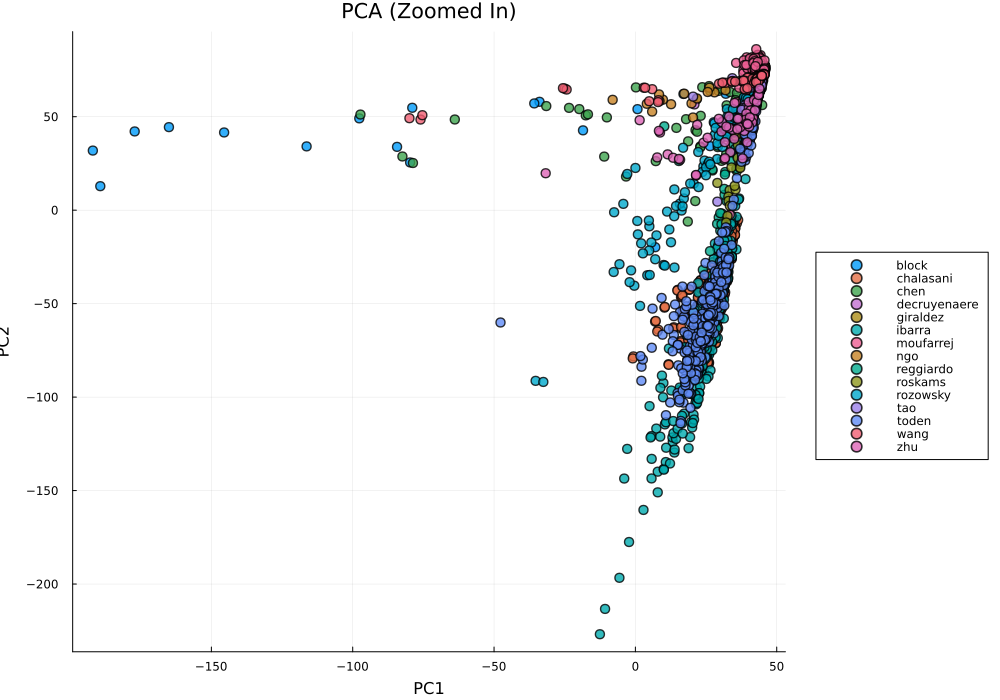

In [104]:
pca_df_subset = filter(:PC1 => x -> abs(x) < 200, pca_df_filtered)

@df pca_df_subset scatter(
    :PC1, :PC2,
    group = :Dataset,
    title = "PCA (Zoomed In)",
    xlabel = "PC1", ylabel = "PC2",
    markersize = 5, alpha = 0.8,
    legend = :outerright,
    size = (1000, 700)
)
